<a href="https://colab.research.google.com/github/Covic/P2ISLA_2023_G_AnDaVa/blob/main/ProjetoIIAv4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Importa as bibliotecas


In [63]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from sklearn.linear_model import LinearRegression
import requests
import io
import itertools
import warnings
warnings.filterwarnings("ignore")
!pip install pmdarima
from pmdarima.arima import auto_arima
from datetime import datetime, timedelta

In [3]:
# Caminho para os arquivos CSV
url_cities = 'https://drive.google.com/file/d/1w4RTI9tqUBXFOawQUvhkpPZ0Ie6m1Zl3/view?usp=sharing '
url_sales = 'https://drive.google.com/file/d/1xVHv5Dbd2Ot5MJptWLd3FFzEmjI2UEat/view?usp=drive_link'
url_product = 'https://drive.google.com/file/d/1-xZWqrotDIYcAEK-2P3fKGU1fOTqxv3J/view?usp=drive_link'


In [4]:
#Le url do drive
#csv cities
file_id_cities = '1w4RTI9tqUBXFOawQUvhkpPZ0Ie6m1Zl3'
url_cities = f'https://drive.google.com/uc?id={file_id_cities}'
cities = pd.read_csv(url_cities)

#csv product
file_id_product = '1wQSI6rSeapiPrPn4tQkJUsmMABptTiIn'
url_product = f'https://drive.google.com/uc?id={file_id_product}'
product = pd.read_csv(url_product)

In [5]:
# Exibindo o conteúdo do dataframe cities
print(cities.head())

  store_id storetype_id  store_size city_id_old country_id city_code
0    S0036         ST04          21        C001     TURKEY   Denizli
1    S0005         ST04          19        C001     TURKEY   Denizli
2    S0104         ST04          47        C002     TURKEY    Ankara
3    S0068         ST03          14        C003     TURKEY     ?zmir
4    S0086         ST03          12        C003     TURKEY     ?zmir


In [6]:
# Exibindo o conteúdo do dataframe product
print(product.head())

  product_id  product_length  product_depth  product_width cluster_id  \
0      P0000             5.0           20.0           12.0        NaN   
1      P0001            13.5           22.0           20.0  cluster_5   
2      P0002            22.0           40.0           22.0  cluster_0   
3      P0004             2.0           13.0            4.0  cluster_3   
4      P0005            16.0           30.0           16.0  cluster_9   

  hierarchy1_id hierarchy2_id hierarchy3_id hierarchy4_id hierarchy5_id  
0           H00         H0004       H000401     H00040105   H0004010534  
1           H01         H0105       H010501     H01050100   H0105010006  
2           H03         H0315       H031508     H03150800   H0315080028  
3           H03         H0314       H031405     H03140500   H0314050003  
4           H03         H0312       H031211     H03121109   H0312110917  


In [7]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [8]:
#csv sales
caminho_arquivo = '/content/drive/MyDrive/P2source/sales.csv'
sales = pd.read_csv(caminho_arquivo)

In [9]:
# Exibindo o conteúdo do dataframe sales
sales

,Unnamed: 0,store_id,product_id,date,sales,revenue,stock,price,promo_type_1,promo_bin_1,promo_type_2,promo_bin_2,promo_discount_2,promo_discount_type_2
0,1,S0002,P0001,2017-01-02,0.0,0.00,8.0,6.25,PR14,NaN,PR03,NaN,NaN,NaN
1,2,S0002,P0005,2017-01-02,0.0,0.00,11.0,33.90,PR14,NaN,PR03,NaN,NaN,NaN
2,3,S0002,P0011,2017-01-02,0.0,0.00,9.0,49.90,PR14,NaN,PR03,NaN,NaN,NaN
3,4,S0002,P0015,2017-01-02,1.0,2.41,19.0,2.60,PR14,NaN,PR03,NaN,NaN,NaN
4,5,S0002,P0017,2017-01-02,0.0,0.00,12.0,1.49,PR14,NaN,PR03,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8886053,8886054,S0143,P0676,2019-10-31,NaN,NaN,NaN,19.90,PR03,verylow,PR03,NaN,NaN,NaN
8886054,8886055,S0143,P0680,2019-10-31,NaN,NaN,NaN,139.90,PR14,NaN,PR03,NaN,NaN,NaN
8886055,8886056,S0143,P0694,2019-10-31,NaN,NaN,NaN,7.50,PR14,NaN,PR03,NaN,NaN,NaN
8886056,8886057,S0143,P0718,2019-10-31,NaN,NaN,NaN,23.75,PR14,NaN,PR03,NaN,NaN,NaN


In [10]:
#Juntando os dataframes
df = pd.merge(sales, cities, on='store_id', how='inner')
df = pd.merge(sales, product, on='product_id', how='inner')

In [11]:
# Configurar o Pandas para mostrar todas as colunas
pd.options.display.max_columns = None
df

,Unnamed: 0,store_id,product_id,date,sales,revenue,stock,price,promo_type_1,promo_bin_1,promo_type_2,promo_bin_2,promo_discount_2,promo_discount_type_2,product_length,product_depth,product_width,cluster_id,hierarchy1_id,hierarchy2_id,hierarchy3_id,hierarchy4_id,hierarchy5_id
0,1,S0002,P0001,2017-01-02,0.0,0.0,8.0,6.25,PR14,NaN,PR03,NaN,NaN,NaN,13.5,22.0,20.0,cluster_5,H01,H0105,H010501,H01050100,H0105010006
1,184,S0002,P0001,2017-01-03,0.0,0.0,8.0,6.25,PR14,NaN,PR03,NaN,NaN,NaN,13.5,22.0,20.0,cluster_5,H01,H0105,H010501,H01050100,H0105010006
2,365,S0002,P0001,2017-01-04,0.0,0.0,8.0,6.25,PR14,NaN,PR03,NaN,NaN,NaN,13.5,22.0,20.0,cluster_5,H01,H0105,H010501,H01050100,H0105010006
3,545,S0002,P0001,2017-01-05,0.0,0.0,8.0,6.25,PR14,NaN,PR03,NaN,NaN,NaN,13.5,22.0,20.0,cluster_5,H01,H0105,H010501,H01050100,H0105010006
4,725,S0002,P0001,2017-01-06,0.0,0.0,8.0,6.25,PR14,NaN,PR03,NaN,NaN,NaN,13.5,22.0,20.0,cluster_5,H01,H0105,H010501,H01050100,H0105010006
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8886053,8828515,S0104,P0396,2019-10-27,NaN,NaN,NaN,7.90,PR14,NaN,PR03,NaN,NaN,NaN,3.0,7.0,3.0,cluster_0,H01,H0108,H010806,H01080616,H0108061601
8886054,8828818,S0104,P0396,2019-10-28,NaN,NaN,NaN,7.90,PR14,NaN,PR03,NaN,NaN,NaN,3.0,7.0,3.0,cluster_0,H01,H0108,H010806,H01080616,H0108061601
8886055,8829119,S0104,P0396,2019-10-29,NaN,NaN,NaN,7.90,PR14,NaN,PR03,NaN,NaN,NaN,3.0,7.0,3.0,cluster_0,H01,H0108,H010806,H01080616,H0108061601
8886056,8829418,S0104,P0396,2019-10-30,NaN,NaN,NaN,7.90,PR14,NaN,PR03,NaN,NaN,NaN,3.0,7.0,3.0,cluster_0,H01,H0108,H010806,H01080616,H0108061601


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8886058 entries, 0 to 8886057
Data columns (total 23 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   Unnamed: 0             int64  
 1   store_id               object 
 2   product_id             object 
 3   date                   object 
 4   sales                  float64
 5   revenue                float64
 6   stock                  float64
 7   price                  float64
 8   promo_type_1           object 
 9   promo_bin_1            object 
 10  promo_type_2           object 
 11  promo_bin_2            object 
 12  promo_discount_2       float64
 13  promo_discount_type_2  object 
 14  product_length         float64
 15  product_depth          float64
 16  product_width          float64
 17  cluster_id             object 
 18  hierarchy1_id          object 
 19  hierarchy2_id          object 
 20  hierarchy3_id          object 
 21  hierarchy4_id          object 
 22  hierarchy5_id     

In [13]:
#Separa as variáveis categóricas
cat_var = df[['promo_type_1', 'promo_bin_1', 'promo_type_2', 'promo_bin_2', 'promo_discount_type_2', 'cluster_id']]

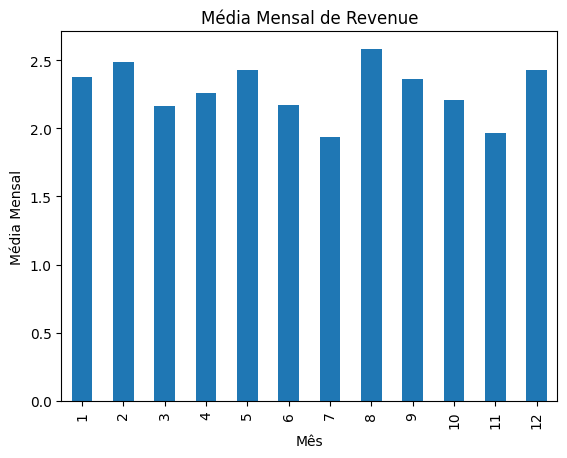

In [14]:
# Calcule a média mensal de revenue:
df['mes'] = pd.to_datetime(df['date']).dt.month
media_mensal = df.groupby('mes')['revenue'].mean()

# Crie o gráfico de barras:
media_mensal.plot(kind='bar')
plt.xlabel('Mês')
plt.ylabel('Média Mensal')
plt.title(f'Média Mensal de Revenue')
plt.show()

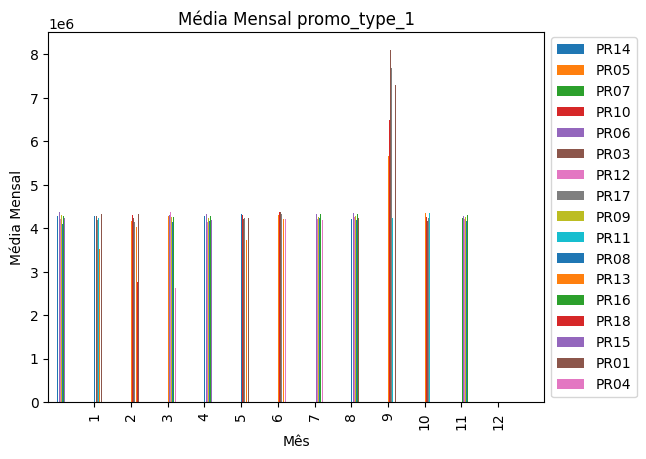

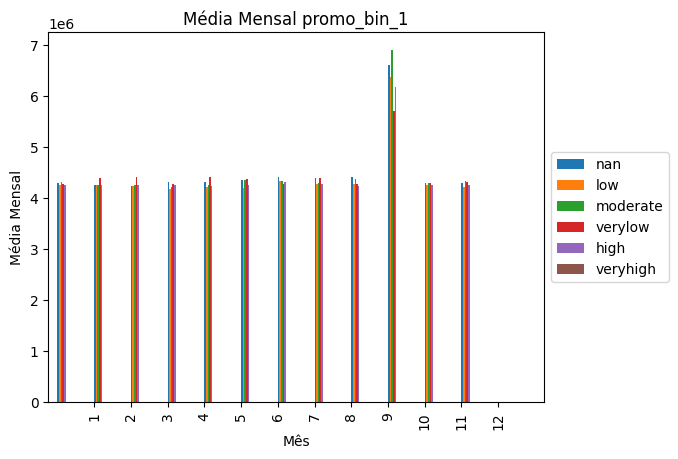

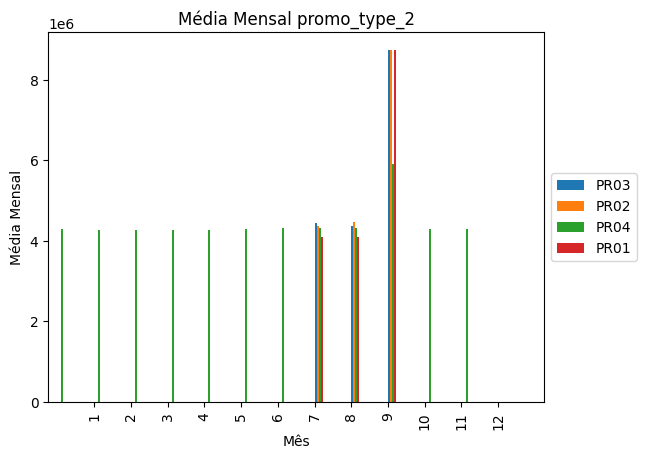

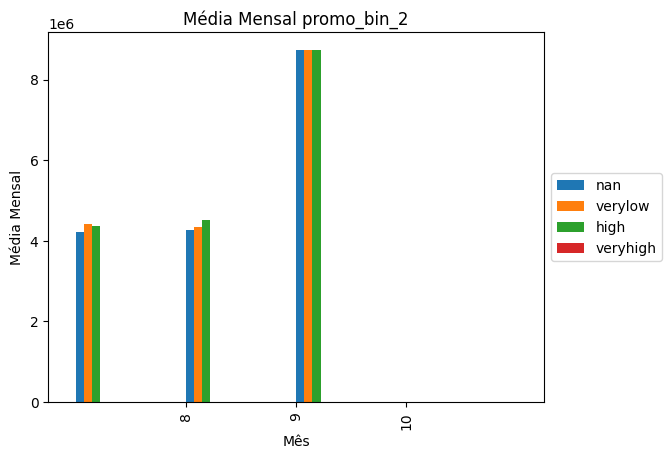

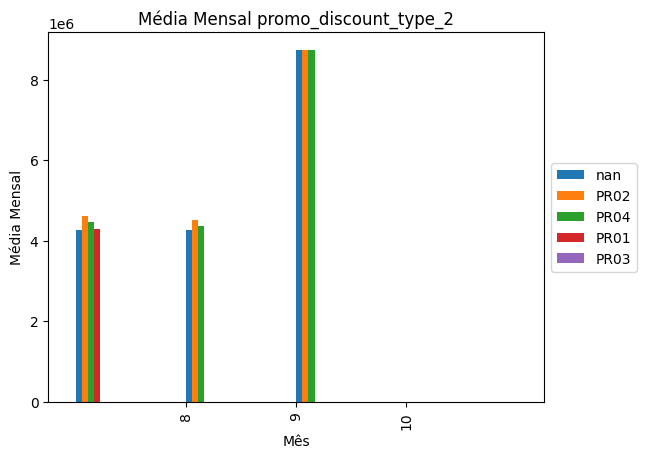

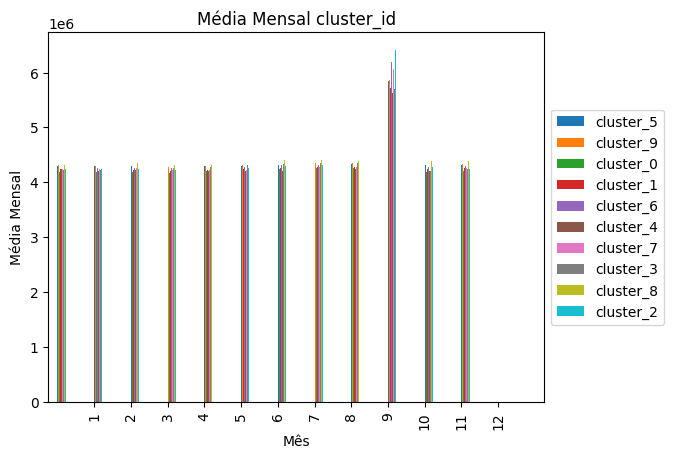

In [15]:
# Extrair o mês da coluna de data
df['mes'] = pd.to_datetime(df['date']).dt.month


for cat in cat_var:
    # Criar uma nova figura com a largura desejada
    labels = df[cat].unique()
    media_mensal = df.groupby(['mes', cat]).mean().unstack()
    media_mensal.plot(kind='bar', width=2)
    plt.xlabel('Mês')
    plt.ylabel('Média Mensal')
    plt.title(f'Média Mensal {cat}')
    plt.legend(labels, loc='center left', bbox_to_anchor=(1, 0.5))
    plt.show()


In [16]:
df.describe()

,Unnamed: 0,sales,revenue,stock,price,promo_discount_2,product_length,product_depth,product_width,mes
count,8.886058e+06,8.583762e+06,8.583762e+06,8.583762e+06,8.794677e+06,12721.000000,8.847242e+06,8.849405e+06,8.849405e+06,8.886058e+06
mean,4.443030e+06,4.734080e-01,2.285173e+00,1.600575e+01,1.575377e+01,30.110605,6.084294e+00,1.745542e+01,1.235898e+01,6.326004e+00
std,2.565184e+06,2.129059e+01,5.406806e+01,3.751692e+01,3.277869e+01,11.850900,5.866296e+00,1.003769e+01,7.717969e+00,3.285615e+00
min,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e-02,16.000000,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
25%,2.221515e+06,0.000000e+00,0.000000e+00,4.000000e+00,3.450000e+00,20.000000,2.200000e+00,1.130000e+01,7.500000e+00,4.000000e+00
50%,4.443030e+06,0.000000e+00,0.000000e+00,8.000000e+00,8.000000e+00,20.000000,5.000000e+00,1.700000e+01,1.020000e+01,6.000000e+00
75%,6.664544e+06,0.000000e+00,0.000000e+00,1.700000e+01,1.695000e+01,35.000000,7.300000e+00,2.300000e+01,1.500000e+01,9.000000e+00
max,8.886058e+06,4.330100e+04,8.419796e+04,4.655000e+03,1.599000e+03,50.000000,1.000000e+02,1.650000e+02,1.000000e+02,1.200000e+01


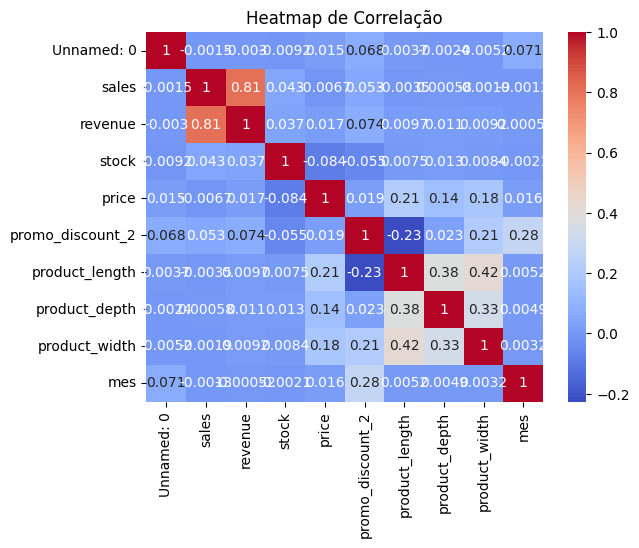

In [17]:
# Calcula a matriz de correlação
corr_matrix = df.corr()

# Cria um heatmap com seaborn
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')

# Configurações adicionais
plt.title('Heatmap de Correlação')

# Mostra o heatmap
plt.show()

Parece não haver correlação entre as variáveis numéricas com a variável revenue


In [18]:
data_inicial = pd.to_datetime(df["date"]).min()
data_final = pd.to_datetime(df["date"]).max()


In [72]:
# Obter os store_ids únicos
unique_store_ids = df['store_id'].unique()
unique_store_ids

array(['S0002', 'S0010', 'S0012', 'S0015', 'S0020', 'S0023', 'S0026',
       'S0038', 'S0040', 'S0045', 'S0050', 'S0052', 'S0055', 'S0056',
       'S0058', 'S0061', 'S0062', 'S0067', 'S0072', 'S0073', 'S0083',
       'S0085', 'S0091', 'S0094', 'S0097', 'S0102', 'S0104', 'S0107',
       'S0108', 'S0122', 'S0126', 'S0131', 'S0132', 'S0142', 'S0095',
       'S0003', 'S0007', 'S0014', 'S0016', 'S0030', 'S0032', 'S0039',
       'S0059', 'S0068', 'S0071', 'S0076', 'S0077', 'S0080', 'S0086',
       'S0088', 'S0089', 'S0099', 'S0109', 'S0120', 'S0136', 'S0141',
       'S0143', 'S0005', 'S0022', 'S0036', 'S0046', 'S0092', 'S0041'],
      dtype=object)

In [20]:
# Converter a coluna "date" em formato de data
df["date"] = pd.to_datetime(df["date"])

# Filtrar o DataFrame para obter apenas as colunas necessárias
df2 = df[["date", "revenue", "store_id"]]


Baseline - Modelo ARIMA




In [21]:
# Criar uma lista para armazenar as previsões de cada loja
all_predictions_arima = []

# Iterar sobre cada loja
for id in unique_store_ids:
    # Filtrar os dados apenas para a loja atual
    store_data = df2[df2['store_id'] == id]

    # Definir a coluna "date" como o índice do DataFrame
    store_data.set_index("date", inplace=True)

    # Criar a série temporal com frequência semanal
    ts = store_data['revenue'].resample('W').sum().asfreq('W')

    # Verificar se há dados suficientes para treinamento
    if len(ts) < 52:
        print(f"Sem dados suficientes para a loja {id}.")
        continue


    # Dividir os dados em treinamento e teste
    train_data = ts[:-52]  # Usar dados históricos como treinamento
    test_data = ts[-52:]   # Último ano como teste

    # Iterar sobre todas as combinações possíveis de ordem
    stepwise_model = auto_arima(ts, start_p=1, start_q=1,
                           max_p=3, max_q=3, m=12,
                           start_P=0, seasonal=False,
                           d=1, D=1, trace=True,
                           error_action='ignore',
                           suppress_warnings=True,
                           stepwise=True)

    # Treina o modelo
    stepwise_model.fit(train_data)

    # Realiza a previsão semanal
    predictions, conf_int = stepwise_model.predict(n_periods=52, return_conf_int=True)


    # Armazenar as previsões no formato desejado
    store_predictions = pd.DataFrame({
        'date': predictions.index,
        'store_id': id,
        'revenue': ts[-52:],
        'revenue_prediction': predictions.values,
        'lower_bound': conf_int[:, 0],
        'upper_bound': conf_int[:, 1]
    })

    # Adicionar as previsões da loja atual à lista geral de previsões
    all_predictions_arima.append(store_predictions)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2665.635, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2644.265, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2629.542, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2663.643, Time=0.03 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2630.585, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2627.605, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2621.103, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2642.272, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2621.504, Time=0.12 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2628.568, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2625.295, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2634.756, Time=0.04 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=2

In [22]:
# Concatenar as previsões de todas as lojas em um único DataFrame
all_predictions_arima = pd.concat(all_predictions_arima)

In [23]:
all_predictions_arima[all_predictions_arima['store_id'] == 'S0002']

,date,store_id,revenue,revenue_prediction,lower_bound,upper_bound
date,,,,,,
2018-11-11,2018-11-11,S0002,2561.47,3101.861349,243.113984,5960.608714
2018-11-18,2018-11-18,S0002,2550.94,3204.833549,101.581164,6308.085934
2018-11-25,2018-11-25,S0002,2607.10,3243.907920,86.787931,6401.027909
2018-12-02,2018-12-02,S0002,2610.98,3258.735285,83.047402,6434.423168
2018-12-09,2018-12-09,S0002,3123.20,3264.361755,78.638779,6450.084731
2018-12-16,2018-12-16,S0002,3450.06,3266.496805,73.295581,6459.698028
2018-12-23,2018-12-23,S0002,3546.61,3267.306982,67.505652,6467.108313
2018-12-30,2018-12-30,S0002,2941.19,3267.614416,61.538766,6473.690066
2019-01-06,2019-01-06,S0002,3655.08,3267.731077,55.509628,6479.952525


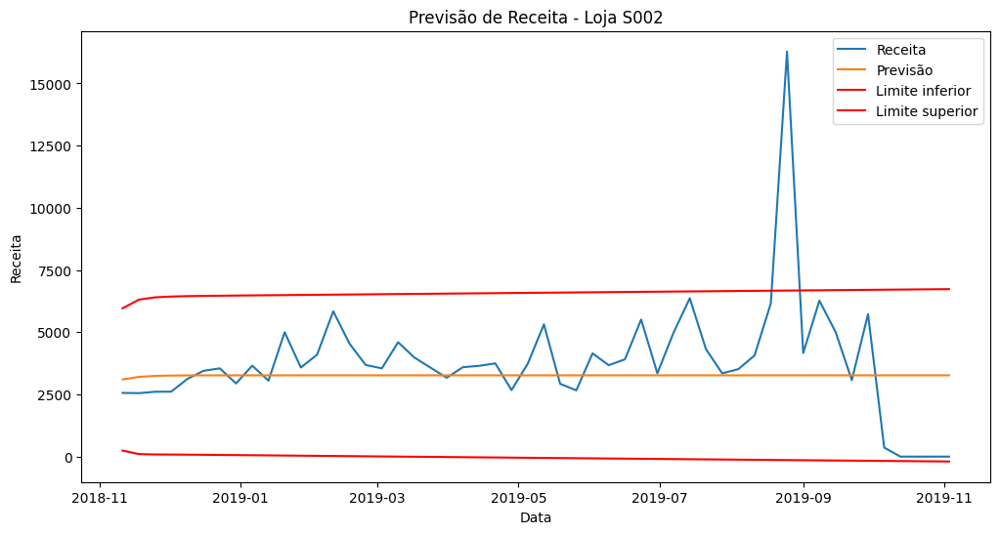

In [24]:
# Filtrar as previsões apenas para a loja específica (por exemplo, "S002")
store_predictions = all_predictions_arima[all_predictions_arima['store_id'] == 'S0002']

# Plotar o gráfico da receita e da previsão para a loja específica
plt.figure(figsize=(12, 6))
plt.plot(store_predictions['date'], store_predictions['revenue'], label='Receita')
plt.plot(store_predictions['date'], store_predictions['revenue_prediction'], label='Previsão')
plt.plot(store_predictions['date'], store_predictions['lower_bound'], label='Limite inferior', color='red')
plt.plot(store_predictions['date'], store_predictions['upper_bound'], label='Limite superior', color='red')
plt.title(f"Previsão de Receita - Loja S002")
plt.xlabel("Data")
plt.ylabel("Receita")
plt.legend()
plt.show()

Modelo - SARIMA

In [25]:
# Criar uma lista para armazenar as previsões de cada loja
all_predictions_sarima = []

# Iterar sobre cada loja
for id in unique_store_ids:
    # Filtrar os dados apenas para a loja atual
    store_data = df2[df2['store_id'] == id]

    # Definir a coluna "date" como o índice do DataFrame
    store_data.set_index("date", inplace=True)

    # Criar a série temporal com frequência semanal
    ts = store_data['revenue'].resample('W').sum().asfreq('W')

    # Dividir os dados em treinamento e teste
    train_data = ts[:-52]  # Usar dados históricos como treinamento
    test_data = ts[-52:]   # Últimas 52 semanas como teste

    # Verificar se há dados suficientes para treinamento
    if len(train_data) < 52:
        print(f"Sem dados suficientes para a loja {id}.")
        continue

    #Remove valores nulos
    train_data = train_data.dropna()

    # Iterar sobre todas as combinações possíveis de ordem
    stepwise_model = auto_arima(train_data, start_p=1, start_q=1,
                           max_p=3, max_q=3, m=12,
                           start_P=0, seasonal=True,
                           d=1, D=1, trace=True,
                           error_action='ignore',
                           suppress_warnings=True,
                           stepwise=True)

    # Treina o modelo
    stepwise_model.fit(train_data)

    # Realiza a previsão semanal
    predictions, conf_int = stepwise_model.predict(n_periods=52, return_conf_int=True)


    # Armazenar as previsões no formato desejado
    store_predictions = pd.DataFrame({
        'date': predictions.index,
        'store_id': id,
        'revenue': ts[-52:],
        'revenue_prediction': predictions.values,
        'lower_bound': conf_int[:, 0],
        'upper_bound': conf_int[:, 1]

    })

    # Adicionar as previsões da loja atual à lista geral de previsões
    all_predictions_sarima.append(store_predictions)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.64 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=1524.807, Time=0.08 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=1490.780, Time=0.84 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=1477.128, Time=1.01 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=1512.139, Time=0.32 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=1478.714, Time=0.99 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=1478.429, Time=1.03 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=1487.114, Time=0.36 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=1481.045, Time=2.45 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=1485.871, Time=0.42 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=inf, Time=0.63 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=1482.600, Time=0.41 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=inf, Time=1.18 sec
 ARIMA(0,1,1)(0,1,1)[12] intercept   : AIC=1479.019, Time=0.93 sec

Best model:  ARIMA(0,1,1)(0,1,1)[

In [26]:
# Concatenar as previsões de todas as lojas em um único DataFrame
all_predictions_sarima = pd.concat(all_predictions_sarima)

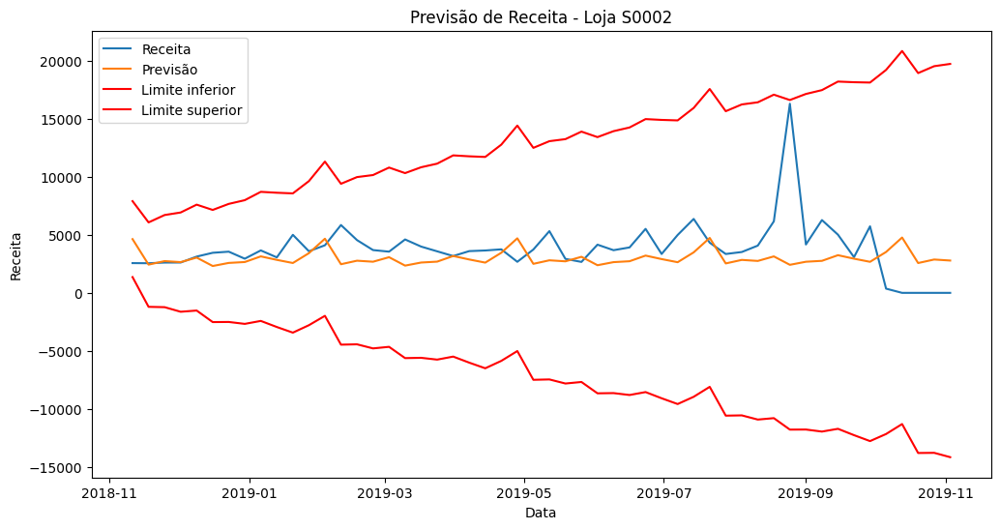

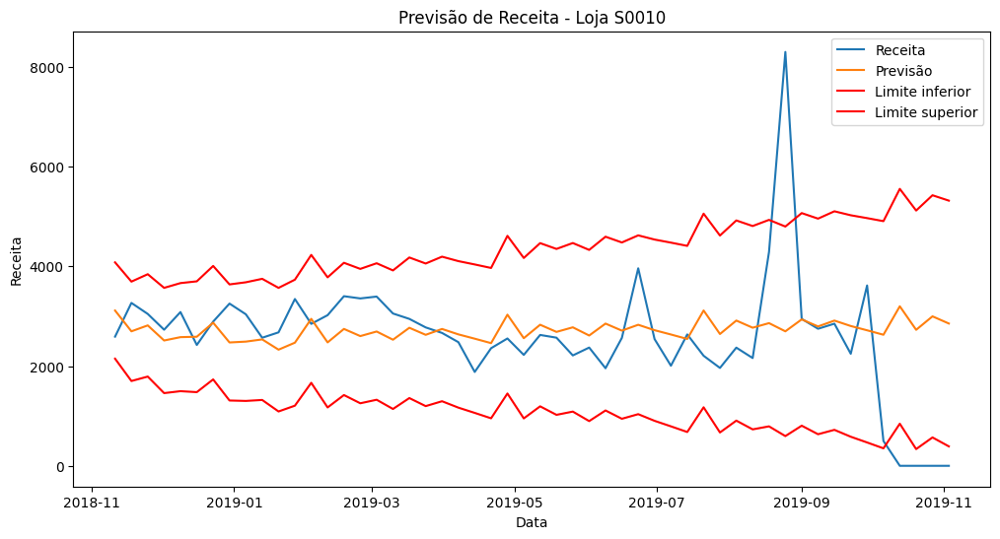

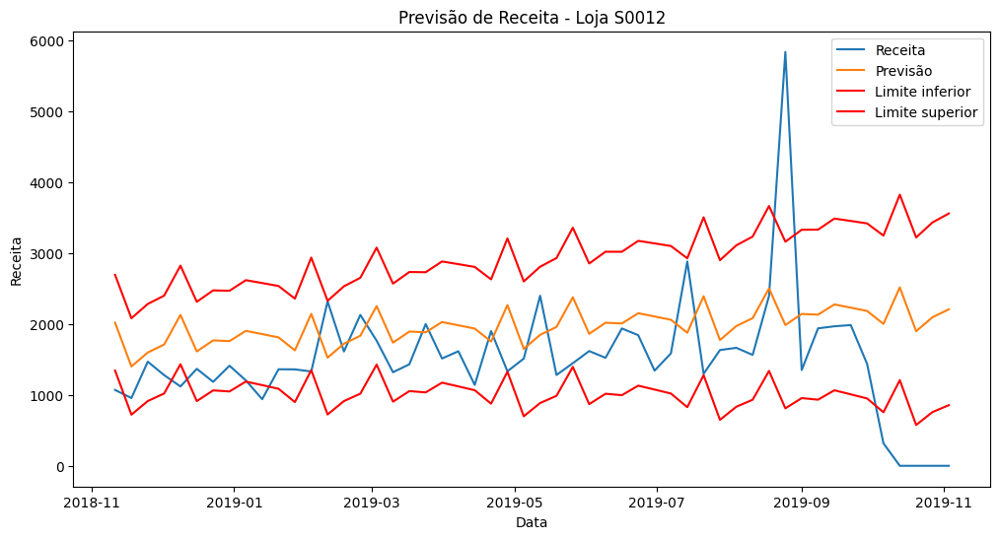

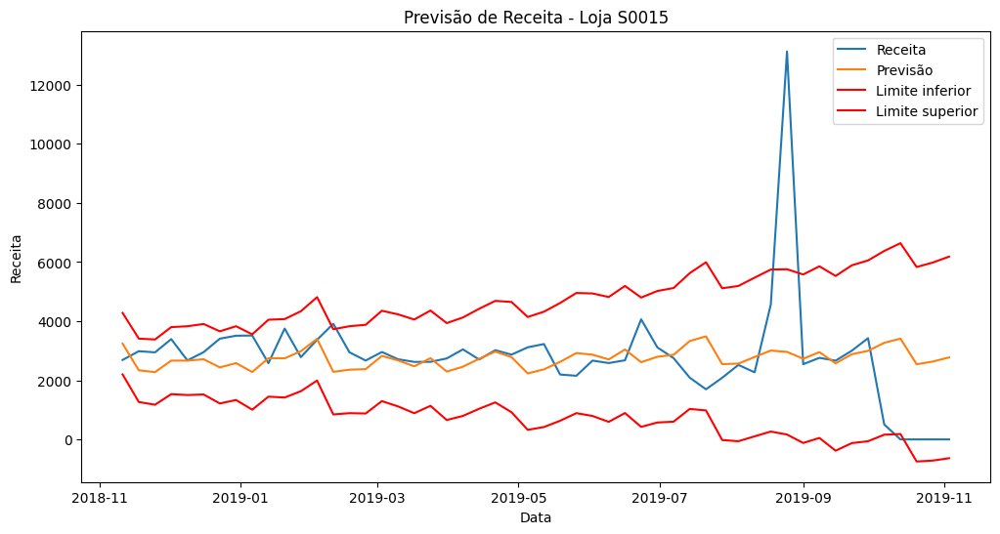

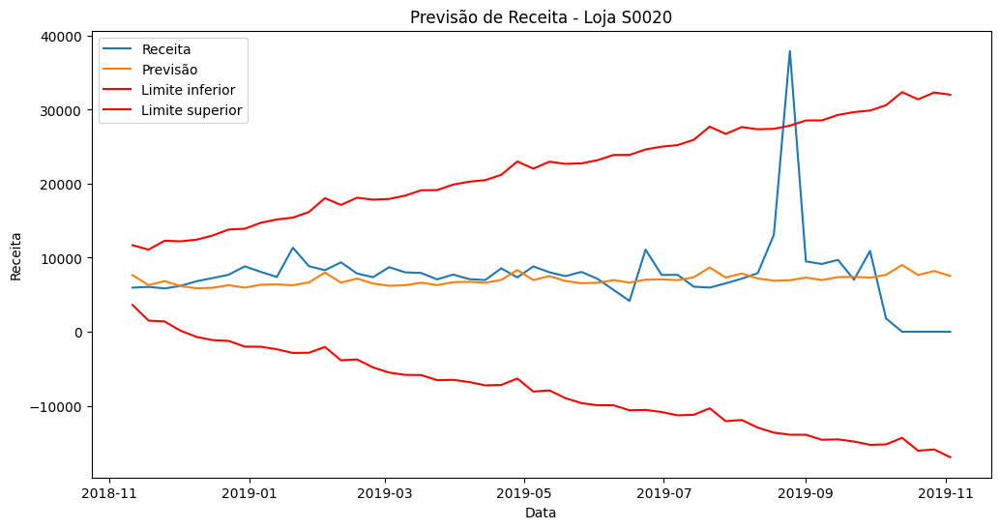

...

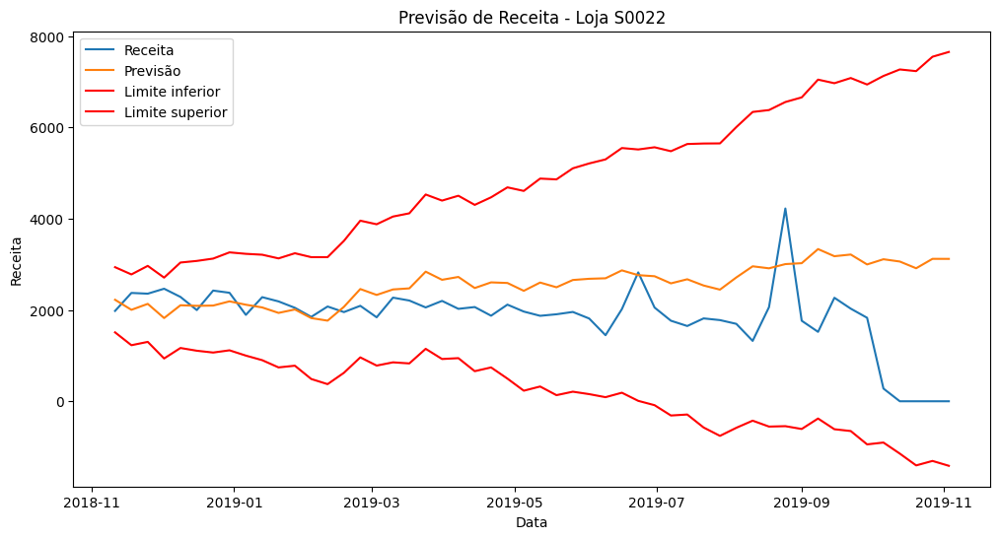

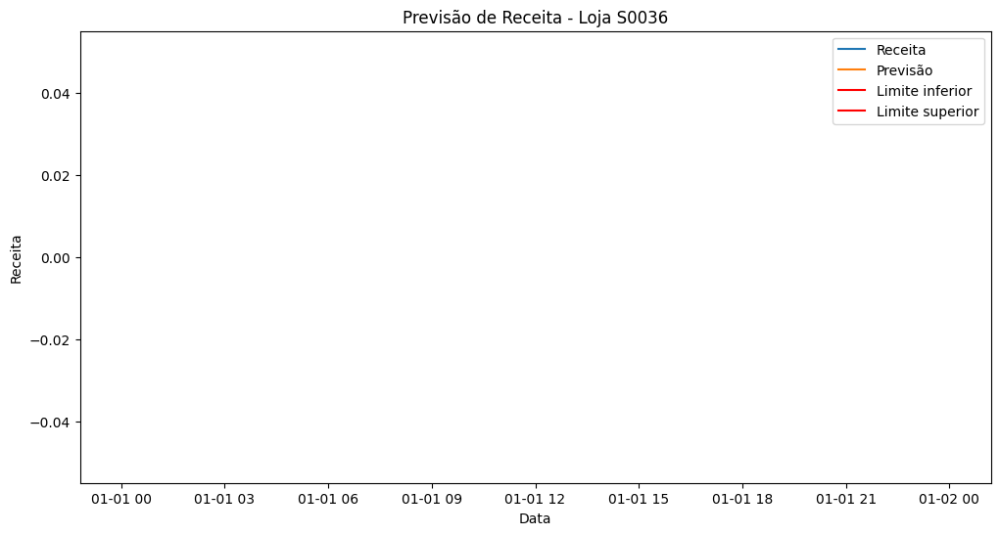

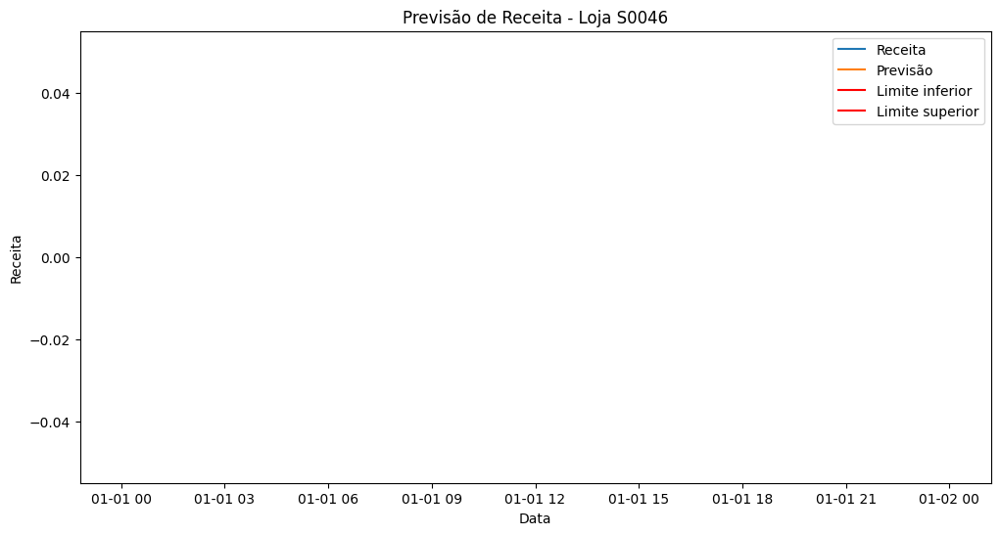

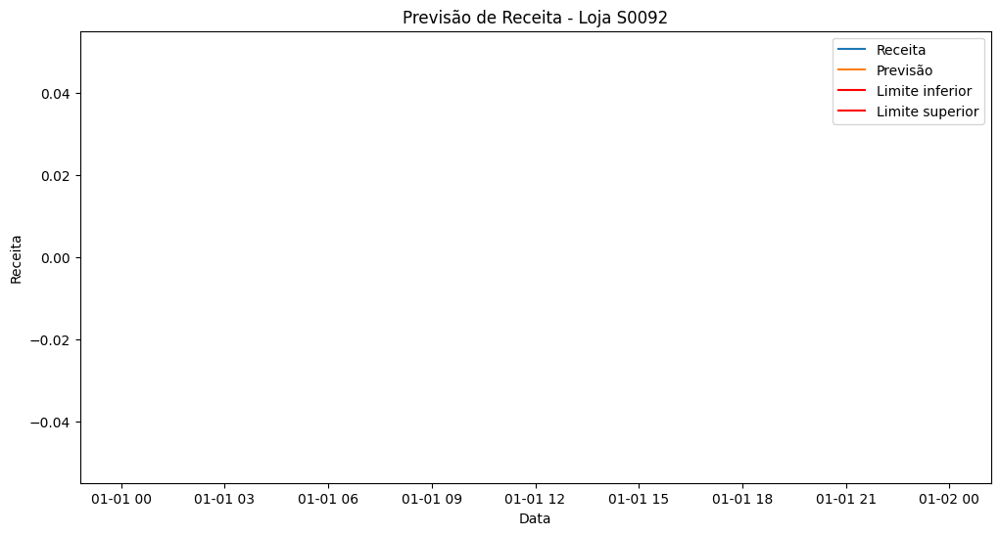

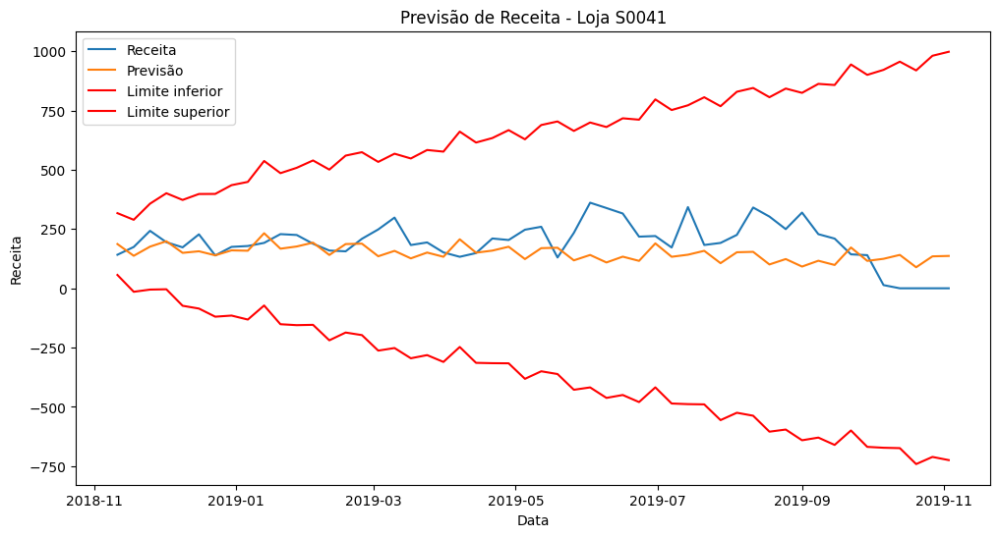

In [27]:
# Filtrar as previsões apenas para a loja específica
for id in unique_store_ids:
    store_predictions = all_predictions_sarima[all_predictions_sarima['store_id'] == id]
    # Plotar o gráfico da receita e da previsão para a loja específica
    plt.figure(figsize=(12, 6))
    plt.plot(store_predictions['date'], store_predictions['revenue'], label='Receita')
    plt.plot(store_predictions['date'], store_predictions['revenue_prediction'], label='Previsão')
    plt.plot(store_predictions['date'], store_predictions['lower_bound'], label='Limite inferior', color='red')
    plt.plot(store_predictions['date'], store_predictions['upper_bound'], label='Limite superior', color='red')
    plt.title(f"Previsão de Receita - Loja {id}")
    plt.xlabel("Data")
    plt.ylabel("Receita")
    plt.legend()
    plt.show()

Modelo - SARIMAX


In [73]:
# Criar uma lista para armazenar as previsões de cada loja
all_predictions_sarimax = []

# Filtrar o DataFrame para obter apenas as colunas necessárias
df3 = df[["date", "revenue", "store_id", 'promo_type_1']]
df3['promo_type_1_binary'] = np.where(df3['promo_type_1'] == 'PR14', 1, 0)
vexog='promo_type_1_binary'

# Iterar sobre cada loja
for id in unique_store_ids:
    # Filtrar os dados apenas para a loja atual
    store_data = df3[df3['store_id'] == id]

    # Definir a coluna "date" como o índice do DataFrame
    store_data.set_index("date", inplace=True)

    # Criar a série temporal com frequência semanal
    rev = store_data['revenue'].resample('W').sum().asfreq('W')
    exog = store_data[vexog].resample('W').count().asfreq('W')
    ts = pd.concat([rev, exog ], axis=1)


    # Dividir os dados em treinamento e teste
    train_data = ts[:-52]  # Usar dados históricos como treinamento
    test_data = ts[-52:]   # Últimas 52 semanas como teste

    # Verificar se há dados suficientes para treinamento
    if len(train_data) < 52:
        print(f"Sem dados suficientes para a loja {id}.")
        continue

    # Remover valores nulos
    train_data = train_data.dropna()

    # Iterar sobre todas as combinações possíveis de ordem
    stepwise_model = auto_arima(train_data['revenue'], X=train_data[[vexog]],
                           start_p=1, start_q=1,
                           max_p=3, max_q=3, m=12,
                           start_P=0, seasonal=True,
                           d=1, D=1, trace=True,
                           error_action='ignore',
                           suppress_warnings=True,
                           stepwise=True)

    # Treina o modelo
    t = stepwise_model.fit(train_data['revenue'], X=train_data[[vexog]])


    # Realizar a previsão semanal
    predictions, conf_int = t.predict(n_periods=52, X=test_data[[vexog]], return_conf_int=True)

    # Armazenar as previsões no formato desejado
    store_predictions = pd.DataFrame({
        'date': test_data.index,
        'store_id': id,
        'revenue': test_data['revenue'],
        'revenue_prediction': predictions,
        'lower_bound': conf_int[:, 0],
        'upper_bound': conf_int[:, 1]
    })

    # Adicionar as previsões da loja atual à lista geral de previsões
    all_predictions_sarimax.append(store_predictions)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.43 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=1526.766, Time=0.18 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=1491.534, Time=1.30 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=1478.190, Time=2.14 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=1512.905, Time=0.26 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=1479.548, Time=1.24 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=1479.112, Time=1.77 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=1486.871, Time=0.51 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=1480.431, Time=3.22 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=1487.838, Time=0.66 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=inf, Time=0.85 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=1484.540, Time=0.57 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=1475.276, Time=1.38 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=inf, Time=0.41 sec
 ARIMA(1,1,2)(1,1,1)[12]          

In [74]:
# Concatenar as previsões de todas as lojas em um único DataFrame
all_predictions_sarimax = pd.concat(all_predictions_sarimax)

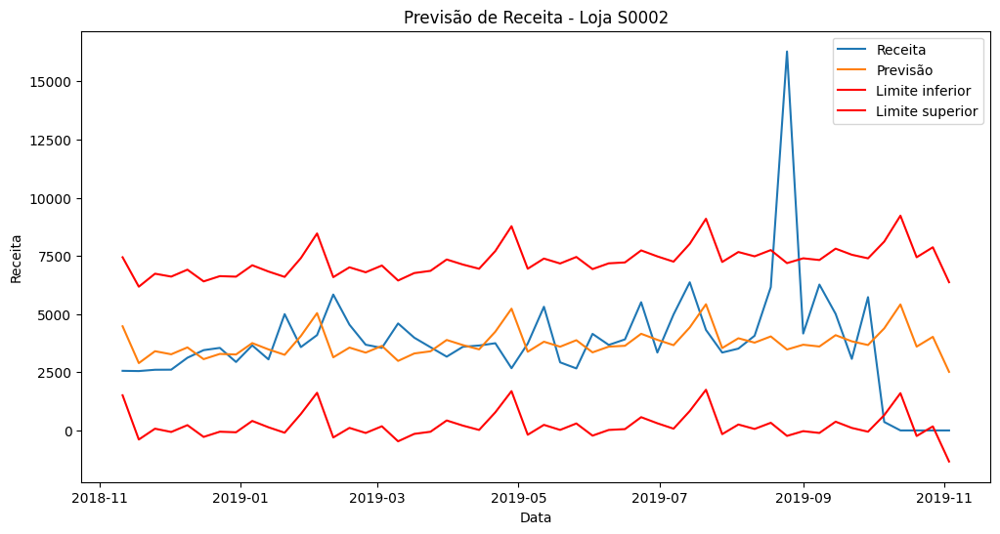

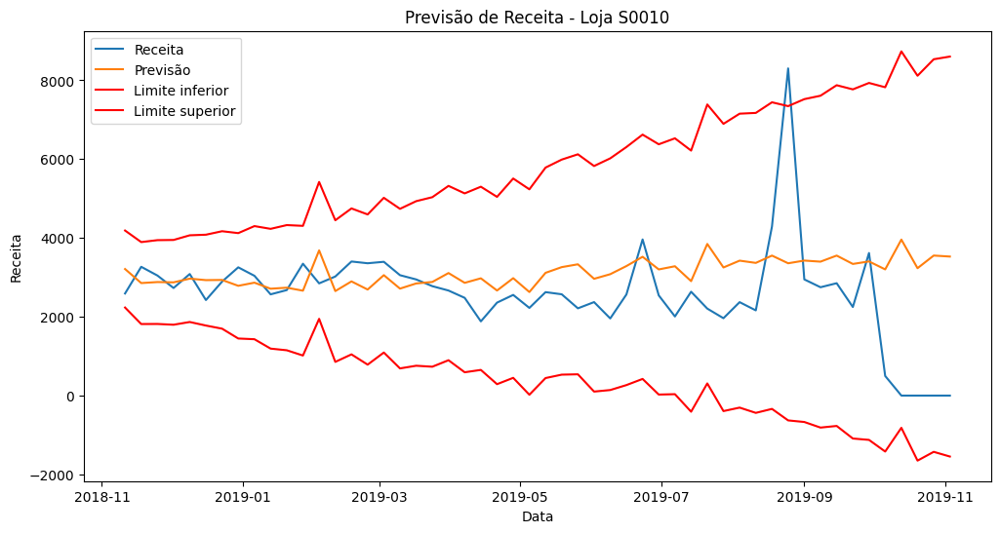

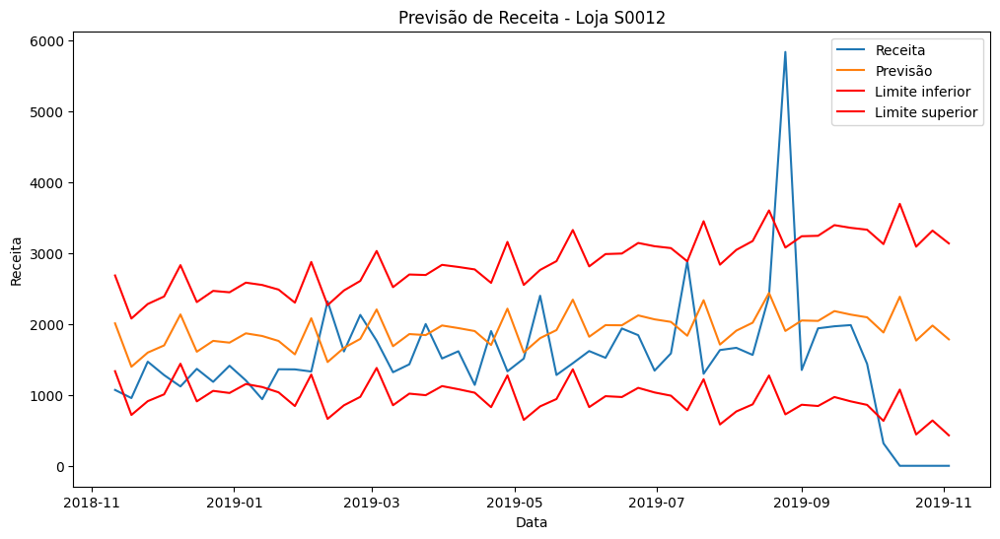

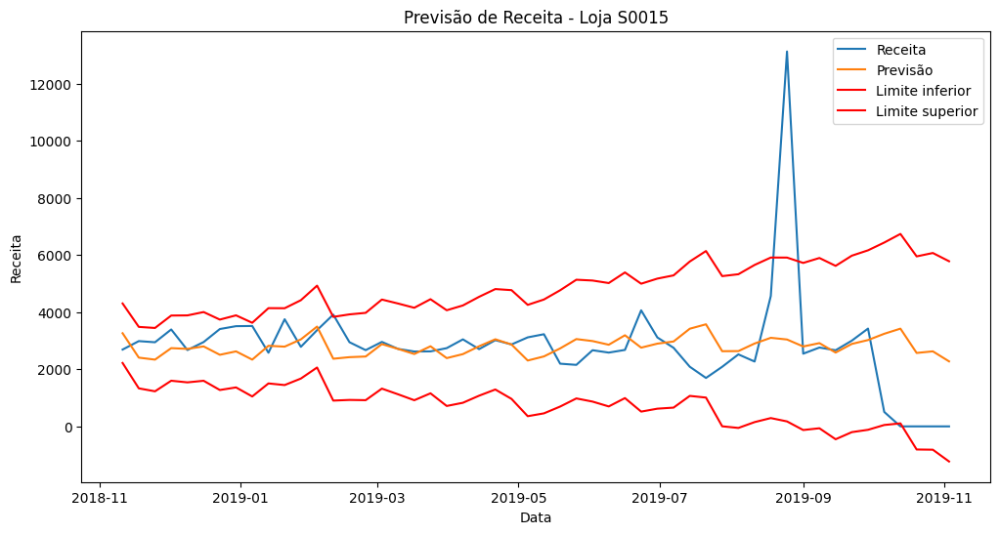

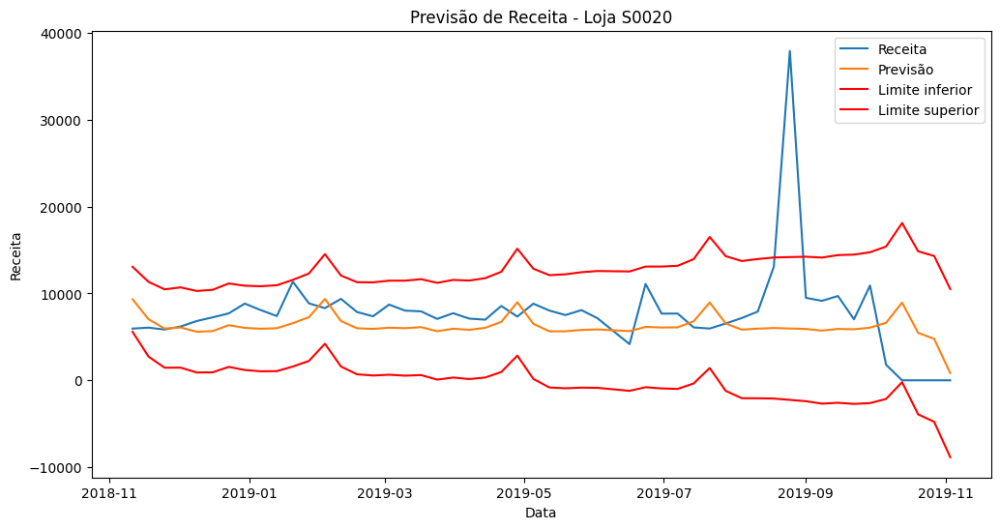

...

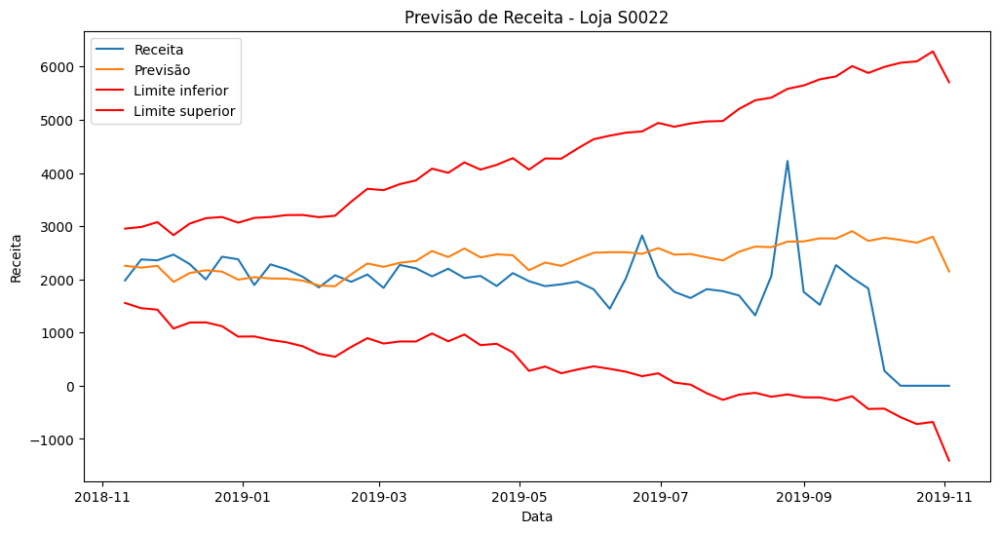

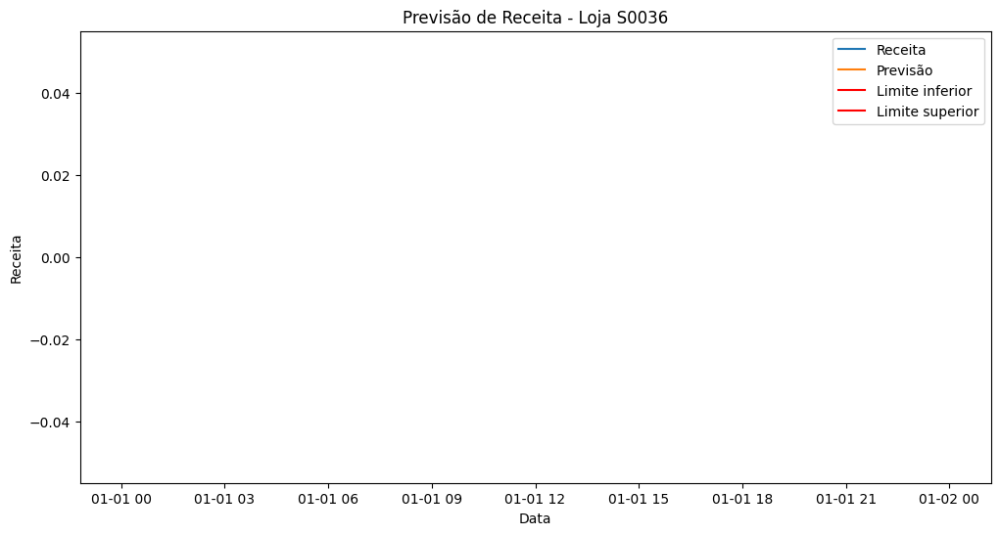

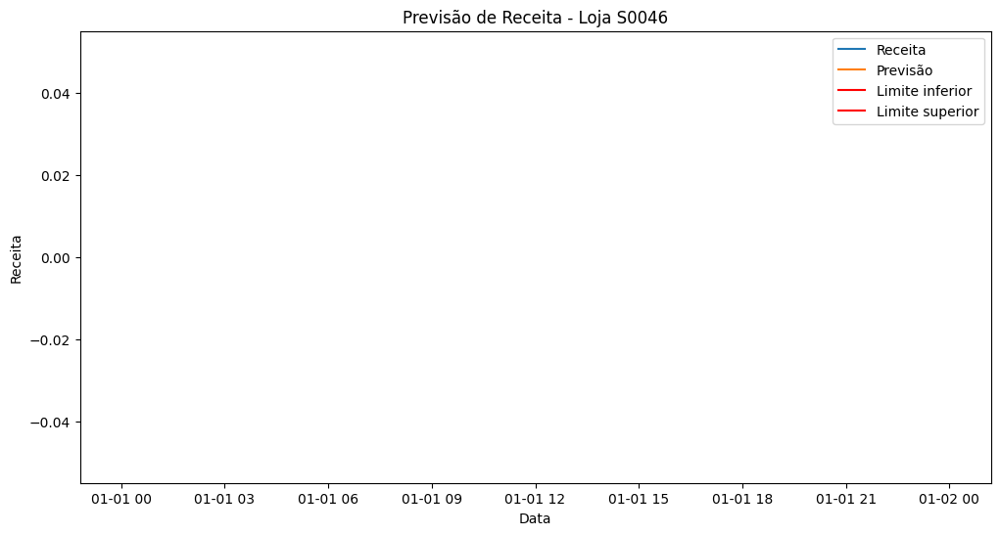

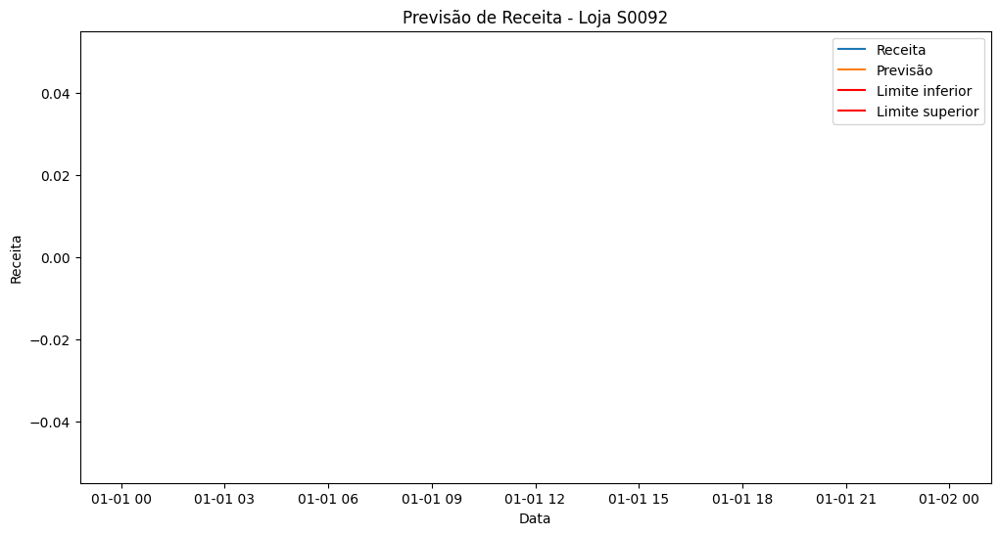

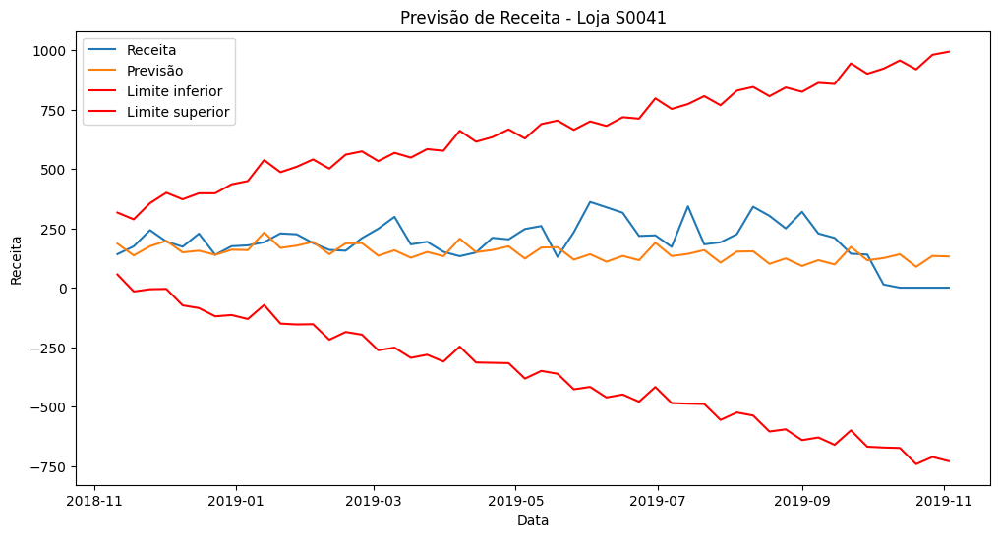

In [75]:
# Filtrar as previsões apenas para a loja específica
for id in unique_store_ids:
    store_predictions = all_predictions_sarimax[all_predictions_sarimax['store_id'] == id]
    # Plotar o gráfico da receita e da previsão para a loja específica
    plt.figure(figsize=(12, 6))
    plt.plot(store_predictions['date'], store_predictions['revenue'], label='Receita')
    plt.plot(store_predictions['date'], store_predictions['revenue_prediction'], label='Previsão')
    plt.plot(store_predictions['date'], store_predictions['lower_bound'], label='Limite inferior', color='red')
    plt.plot(store_predictions['date'], store_predictions['upper_bound'], label='Limite superior', color='red')
    plt.title(f"Previsão de Receita - Loja {id}")
    plt.xlabel("Data")
    plt.ylabel("Receita")
    plt.legend()
    plt.show()

In [76]:
caminho_arquivo = '/content/drive/MyDrive/previsao_arima.csv'
# Salvando os dados do DataFrame no arquivo CSV
all_predictions_arima.to_csv(caminho_arquivo, index=False)

caminho_arquivo = '/content/drive/MyDrive/previsao_sarima.csv'
# Salvando os dados do DataFrame no arquivo CSV
all_predictions_sarima.to_csv(caminho_arquivo, index=False)


caminho_arquivo = '/content/drive/MyDrive/previsao_sarimax.csv'
# Salvando os dados do DataFrame no arquivo CSV
all_predictions_sarimax.to_csv(caminho_arquivo, index=False)